In [1]:
import os
import sys

import folium
import pandas as pd
import unidecode

module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
from src.db_functions import create_sql_alchemy_db_engine
from src.helpers import remove_accents
from src.plot_helpers import set_matplotlib_defaults

In [2]:
set_matplotlib_defaults()

In [3]:
conn = create_sql_alchemy_db_engine()

In [19]:
orders = pd.read_sql("SELECT * FROM orders", conn)
customers = (
    pd.read_sql("SELECT * FROM customers", conn)
    .rename({
        'customer_zip_code_prefix': 'zip_code_prefix', 
        'customer_city': 'city',
        'customer_state': 'state'
    }, axis=1)
    .assign(city = lambda df: df.city.apply(remove_accents))
)
sellers = (
    pd.read_sql("SELECT * FROM sellers", conn)
    .rename({
        'seller_zip_code_prefix': 'zip_code_prefix', 
        'seller_city': 'city',
        'seller_state': 'state'
    }, axis=1)
    .assign(city = lambda df: df.city.apply(remove_accents))
)
geoloc = (
    pd.read_sql("SELECT * FROM geolocation", conn)
    .rename({
        'geolocation_zip_code_prefix': 'zip_code_prefix', 
        'geolocation_city': 'city',
        'geolocation_state': 'state',
        'geolocation_lat': 'lat',
        'geolocation_lng': 'lon'
    }, axis=1)
    .assign(city = lambda df: df.city.apply(remove_accents))
)

How many zip codes are in multiple cities/states?

In [5]:
(
    geoloc
    .groupby('zip_code_prefix')
    [['city', 'state']]
    .nunique()
    .query('state > 1 or city > 1')
).shape[0]

556

In [6]:
# Take the average lat-lon by zipcode, city and state
zipcode_average_latlon = (
    geoloc
    .groupby(['zip_code_prefix', 'city', 'state'])
    [['lat', 'lon']]
    .mean()
    .reset_index()
)

In [7]:
customers_with_loc = customers.merge(zipcode_average_latlon)
customers_with_loc.head()

,customer_id,customer_unique_id,zip_code_prefix,city,state,lat,lon
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,-20.498489,-47.396929
1,5dca924cc99eea2dc5ba40d11ec5dd0f,2761fee7f378f0a8d7682d8a3fa07ab1,14409,franca,SP,-20.498489,-47.396929
2,661897d4968f1b59bfff74c7eb2eb4fc,d06a495406b79cb8203ea21cc0942f8c,14409,franca,SP,-20.498489,-47.396929
3,702b62324327ccba20f1be3465426437,8b3d988f330c1d1c3332ccd440c147b7,14409,franca,SP,-20.498489,-47.396929
4,bdf997bae7ca819b0415f5174d6b4302,866755e25db620f8d7e81b351a15bb2f,14409,franca,SP,-20.498489,-47.396929


In [21]:
sellers_with_loc = sellers.merge(zipcode_average_latlon)
sellers_with_loc.head()

,seller_id,zip_code_prefix,city,state,lat,lon
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP,-22.893848,-47.061337
1,e0eabded302882513ced4ea3eb0c7059,13023,campinas,SP,-22.893848,-47.061337
2,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP,-22.383077,-46.948817
3,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ,-22.909572,-43.177703
4,1d2732ef8321502ee8488e8bed1ab8cd,20031,rio de janeiro,RJ,-22.909572,-43.177703


<AxesSubplot:>

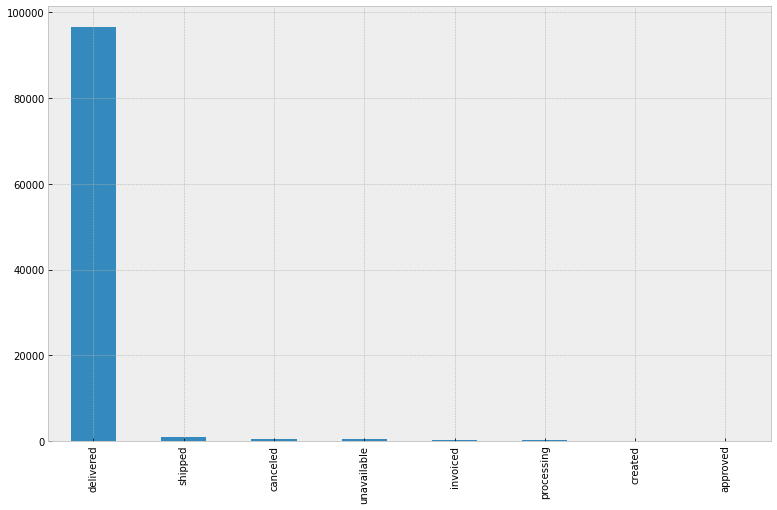

In [9]:
orders.order_status.value_counts().plot.bar()

In [10]:
orders

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26
...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15


In [11]:
orders_with_customer_info = orders.merge(customers_with_loc)
orders_with_customer_info

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,zip_code_prefix,city,state,lat,lon
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,-23.576983,-46.587161
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,-12.177924,-44.660711
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,-16.745150,-48.514783
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,-5.774190,-35.271143
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP,-23.676370,-46.514627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99134,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,6359f309b166b0196dbf7ad2ac62bb5a,12209,sao jose dos campos,SP,-23.178000,-45.883818
99135,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,da62f9e57a76d978d02ab5362c509660,11722,praia grande,SP,-24.001500,-46.449864
99136,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,737520a9aad80b3fbbdad19b66b37b30,45920,nova vicosa,BA,-17.898358,-39.373630
99137,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,5097a5312c8b157bb7be58ae360ef43c,28685,japuiba,RJ,-22.562789,-42.694844


## Folium

Here we'll use folium to get a view of where the orders are being sent and where the sellers are located.
On top of these we can plot Brazil's 10 largest cities' lat-lons (taken from [here](https://simplemaps.com/data/br-cities)).

In [12]:
city_lat_lons = {
    'Sao Paolo': (-23.5504, -46.6339),
    'Rio De Janeiro': (-22.9083, -43.1964),
    'Belo Horizonte': (-19.9281, -43.9419),
    'Brasilia': (-15.7939, -47.8828),
    'Salvador': (-12.9708, -38.5108),
    'Fortaleza': (-3.7275, -38.5275),
    'Curitiba': (-25.4297, -49.2719),
    'Manaus': (-3.1, -60.0167),
    'Recife': (-8.0539, -34.8808),
    'Belem': (-1.4558, -48.5039)
}

In [13]:
m = folium.Map(
    location= [
        orders_with_customer_info['lat'].mean(),
        orders_with_customer_info['lon'].mean()
    ],
    tiles= 'cartodbpositron',
    zoom_start=4
)

In [14]:
for index, row in (
    orders_with_customer_info
    .sample(n=int(len(orders_with_customer_info)/10)) # Take a 10% random sample
    .iterrows() # As ~ 100,000 dots causes problems with plotting
):
    lat = row['lat']
    lon = row['lon']
    
    folium.Circle(
        radius=1,
        location=[lat, lon]
    ).add_to(m)

In [15]:
for key, (lat, lon) in city_lat_lons.items():
    folium.Circle(
        radius=100000,
        location= [lat, lon],
        tooltip=key,
        color='red',
        fill=True
    ).add_to(m)

In [24]:
m

Most major cities are on or near the coast, and the bulk of the orders follow this pattern. There are much fewer orders being made further inland, relative to nearer the coast.

In [17]:
m.save("../figures/orders_location_folium.html")

### Now do the same with sellers

In [27]:
sellers_m = folium.Map(
    location= [
        sellers_with_loc['lat'].mean(),
        sellers_with_loc['lon'].mean()
    ],
    tiles= 'cartodbpositron',
    zoom_start=4
)

In [28]:
for index, row in (
    sellers_with_loc
    .iterrows()
):
    lat = row['lat']
    lon = row['lon']
    
    folium.Circle(
        radius=1,
        location=[lat, lon]
    ).add_to(sellers_m)

In [29]:
for key, (lat, lon) in city_lat_lons.items():
    folium.Circle(
        radius=100000,
        location= [lat, lon],
        tooltip=key,
        color='red',
        fill=True
    ).add_to(sellers_m)

In [30]:
sellers_m

Most sellers are in the South-East, near the major cities.

In [31]:
sellers_m.save("../figures/sellers_location_folium.html")

In [32]:
sellers_with_loc.to_parquet('../data/processed/sellers_with_location.parquet')

In [18]:
orders_with_customer_info.to_parquet('../data/processed/orders_with_cust_info.parquet')